In [1]:
# Imports
import pandas as pd
from pandas import DataFrame
import numpy as np
import os
import matplotlib as mpl
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import to_rgb
from datetime import datetime, timedelta
import nltk
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from scipy.stats import skew
from tqdm import tqdm
from collections import Counter
import itertools
import ast
import shifterator as sh
from chart_studio import plotly as py
from wordcloud import WordCloud
import plotly.graph_objs as go
from sklearn.feature_extraction.text import TfidfVectorizer
import networkx as nx
from networkx.algorithms import bipartite
import netwulf as nw
import community as community_louvain

In [4]:
# Customize parameters of the matplotlib library.
def setup_mpl():
    mpl.rcParams["font.family"] = "Times New Roman"
    mpl.rcParams["lines.linewidth"] = 1
setup_mpl()

In [5]:
color_list = ["303638","f0c808","5d4b20","469374","9341b3","e3427d","e68653","ebe0b0","edfbba","ffadad","ffd6a5","fdffb6","caffbf","9bf6ff","a0c4ff","bdb2ff","ffc6ff","fffffc"]
color_list = ["#"+i.lower() for i in color_list]

### Contributions
All members of the group participated equally throughout the preparation of this project assignment, which includes both the webpage and the explainer notebook. Felix's main responsibility was carring out the temporal and the network analysis. Christian's responsibility has been carring out the text analysis using TF-IDF and lexical dispersions plot in addition to the network analysis. Daniel's responsibility has been to prepross the data, carrying out the sentiment analysis and basic stats and properties of the graphs.

### Motivation

##### What is your dataset?
The dataset for this project consist of the corpus containing the parliamentary debates over the time periode of 05-01-2015 to 01-03-2021 in the British Parliament. The dataset is collected from the publicly avaliable debates and metadata provided British government. The original intent was to investigate what effect COVID had in a parliamentary context. Each speech have a marked-up transcript containing comments, like long gaps, applause, interrupts and ect. 

##### Why did you choose this/these particular dataset(s)?

The political system itself is built upon a very complicated system with a lot of different actors that all have their own agendas. A place where key figures of this system clash, discuss their idea and try to enforce their ideology and political beliefs is the Parliament. Therefore this project will try to explore these complex networks of interactions. This will mainly be done through a toolbox consisting of text analysis of the PM's statements in the British Parliament and network analysis.

##### What was your goal for the end user's experience?
Our main goal was to demonstrate to the user that politics also can be investigated using mainly data-driven approaches while keeping the reader intrigued by having interactive plots that nudge the user to dive deeper and explore the different aspects of the analysis.

### Basic stats. Let's understand the dataset better

##### Write about your choices in data cleaning and preprocessing

First step is to collect and represent the data in a meaningful datastructure that allows for further analysis. For this project all data is collected in a single Pandas dataframe.

The raw data itself is spread over six subfolder, one for each year. In these folders there are two files for each day. One that contains the transcripts themself and another file that contains the corresponding metadata. Each of these files have a ID column that allows to match the rows of the two data files.

In [ ]:
# Create temp meta dataframe
ParlaMint_meta = pd.DataFrame()
rootdir = 'data/ParlaMint-GB.txt'
for subdir, dirs, files in tqdm(os.walk(rootdir)):
    for file in files:
        filename = os.fsdecode(file)
        if filename.endswith(".tsv"):
            #Create the dataframe for metadata
            temp_meta = pd.read_csv(os.path.join(subdir, file), sep = "\t", header = None, skiprows = 1) # Skip the header row
            ParlaMint_meta = pd.concat([ParlaMint_meta, temp_meta], axis = 0) # concat along columns

In [ ]:
# Create temp text dataframe
ParlaMint_text = pd.DataFrame()

rootdir = 'data/ParlaMint-GB.txt'
for subdir, dirs, files in tqdm(os.walk(rootdir)):
    for file in files:
        #print(os.fsdecode(file))
        filename = os.fsdecode(file)
        if filename.endswith(".txt"):
            #Create the dataframe for text
            temp_text = pd.read_csv(os.path.join(subdir, file), sep = "\t", header = None)
            ParlaMint_text = pd.concat([ParlaMint_text, temp_text], axis = 0, ignore_index = True) # concat along columns

In [ ]:
# Test relation between the two dataframes to ensure match in index.
idx_1 = ParlaMint_meta.iloc[:, 0].tolist()
idx_2 = ParlaMint_text.iloc[:, 0].tolist()
idx_1 == idx_2

Now the two dataframes are concatenated together with their column names.

In [ ]:
ParlaMint = ParlaMint_meta.copy()
# Add text as new column
ParlaMint["Text"] = ParlaMint_text[1].values
# create rename dict
column_names = ['ID', 'Title', 'From', 'To', 'House', 'Term', 'Session', 'Meeting',
       'Sitting', 'Agenda', 'Subcorpus', 'Speaker_role', 'Speaker_type',
       'Speaker_party', 'Speaker_party_name', 'Party_status', 'Speaker_name',
       'Speaker_gender', 'Speaker_birth', "Text"]
new_column_names = [(i, item) for i, item in enumerate(column_names)]
new_column_names = {key: value for (key, value) in new_column_names}
ParlaMint.rename(columns = new_column_names, inplace = True)

In [ ]:
# Save to csv
ParlaMint.to_csv("data/parlamint.csv")

##### Write a short section that discusses the dataset stats (here you can recycle the work you did for Project Assignment A)

In the following section a summary of the key values and characteristics are presented. 

First step is to load in the data that was collected in the previous steps.

In [6]:
column_names = ['ID', 'Title', 'From', 'To', 'House', 'Term', 'Session', 'Meeting',
       'Sitting', 'Agenda', 'Subcorpus', 'Speaker_role', 'Speaker_type',
       'Speaker_party', 'Speaker_party_name', 'Party_status', 'Speaker_name',
       'Speaker_gender', 'Speaker_birth', "Text"]
ParlaMint = pd.read_csv("data/parlamint.csv", index_col=False, usecols = column_names)
# Show head of the data
ParlaMint.head()

,ID,Title,From,To,House,Term,Session,Meeting,Sitting,Agenda,Subcorpus,Speaker_role,Speaker_type,Speaker_party,Speaker_party_name,Party_status,Speaker_name,Speaker_gender,Speaker_birth,Text
0,ParlaMint-GB_2015-01-05-commons.u1,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,NaN,NaN,NaN,NaN,Reference,Regular,MP,LD,Liberal Democrat,Coalition,"Willott, Jennifer Nancy",F,-,1. What progress her Department has made on im...
1,ParlaMint-GB_2015-01-05-commons.u2,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,NaN,NaN,NaN,NaN,Reference,Regular,MP,CON,Conservative,Coalition,"May, Theresa Mary",F,-,The Government are on track to deliver their c...
2,ParlaMint-GB_2015-01-05-commons.u3,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,NaN,NaN,NaN,NaN,Reference,Regular,MP,LD,Liberal Democrat,Coalition,"Willott, Jennifer Nancy",F,-,"It is clear that exit checks, which were scrap..."
3,ParlaMint-GB_2015-01-05-commons.u4,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,NaN,NaN,NaN,NaN,Reference,Regular,MP,CON,Conservative,Coalition,"May, Theresa Mary",F,-,"As I indicated in my original answer, we are o..."
4,ParlaMint-GB_2015-01-05-commons.u5,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,NaN,NaN,NaN,NaN,Reference,Regular,MP,LAB,Labour,Opposition,"Cunningham, Alexander",M,-,19. Given the situation at our border in Calai...


Next step is exploration of the size of the dataset

In [5]:
MB_size = os.path.getsize("data/parlamint.csv") / 1024 / 1024 # Convert from byte to MB
print(f"The dataset is {MB_size:0.2f} MB.")
print(f"The dataset consists of {ParlaMint.shape[0]} datapoints each with a feature length of {ParlaMint.shape[1]}.")

The dataset is 676.02 MB.
The dataset consists of 552103 datapoints each with a feature length of 20.


Here each datapoints should be understood as a MP's statement, while the next row in the dataset is the following MP's/speakers statement.

Next step is to explore if there are any redunctant or dirty data that needs to be filter out before further analysis.

In [6]:
ParlaMint.count()

ID                    552103
Title                 552103
From                  552103
To                    552103
House                 552103
Term                  552103
Session                    0
Meeting                    0
Sitting                    0
Agenda                     0
Subcorpus             552103
Speaker_role          552103
Speaker_type          552103
Speaker_party         550489
Speaker_party_name    551961
Party_status          548885
Speaker_name          552103
Speaker_gender        552103
Speaker_birth         552103
Text                  552103
dtype: int64

From the counts of each columns it is seen that the columns Session, Meeting, Sitting , Agenda only contains NaN-values and therefore can be excluded. 

In [8]:
np.unique(ParlaMint["Speaker_birth"].values)

array(['-'], dtype=object)

Here it is seen that the Speaker Birth column only contains "-" and not the actual birthday of the speaker. Therefore this column is also excluded. 

In [9]:
print(ParlaMint["Party_status"][ParlaMint["Party_status"] == "Coalition"])
ParlaMint["From"].iloc[27461]

0        Coalition
1        Coalition
2        Coalition
3        Coalition
5        Coalition
           ...    
27457    Coalition
27458    Coalition
27459    Coalition
27460    Coalition
27461    Coalition
Name: Party_status, Length: 17219, dtype: object


'2015-03-26'

As seen from the above result the lastest statement coming from a member attributed to a member of the coalition is index 27461. This means that the last date a MP is attrubuted to the coalition is the 26-03-2015 and the next 6 years MPs are only noted as Opposition. Therefore this column is also removed.

In [10]:
# Drop columns
ParlaMint.drop(columns = ["Session", "Meeting", "Sitting", "Agenda", "Speaker_birth", "Party_status"], inplace = True)
ParlaMint.head()

,ID,Title,From,To,House,Term,Subcorpus,Speaker_role,Speaker_type,Speaker_party,Speaker_party_name,Speaker_name,Speaker_gender,Text
0,ParlaMint-GB_2015-01-05-commons.u1,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,LD,Liberal Democrat,"Willott, Jennifer Nancy",F,1. What progress her Department has made on im...
1,ParlaMint-GB_2015-01-05-commons.u2,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,CON,Conservative,"May, Theresa Mary",F,The Government are on track to deliver their c...
2,ParlaMint-GB_2015-01-05-commons.u3,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,LD,Liberal Democrat,"Willott, Jennifer Nancy",F,"It is clear that exit checks, which were scrap..."
3,ParlaMint-GB_2015-01-05-commons.u4,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,CON,Conservative,"May, Theresa Mary",F,"As I indicated in my original answer, we are o..."
4,ParlaMint-GB_2015-01-05-commons.u5,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,LAB,Labour,"Cunningham, Alexander",M,19. Given the situation at our border in Calai...


Next step is the found out how many unique speakers and the frequency of how many speeches they make.

In [11]:
len(ParlaMint["Speaker_name"].unique())

1895

The following plot shows the top ten speakers.

In [15]:
fig, ax = plt.subplots(figsize = (18,5), dpi = 1000)
speaker_index = ParlaMint["Speaker_name"].value_counts().iloc[0:10].index.tolist()
speaker_values = ParlaMint["Speaker_name"].value_counts().iloc[0:10].values.tolist()

ax.barh(speaker_index, speaker_values, color = "#a0c4ff")
ax.set_yticks(ticks = range(0, len(speaker_index)), labels = speaker_index, fontsize = 20)
ax.set_xlabel("#Speeches", fontsize = 20)
fig.tight_layout()
fig.canvas.draw()
fig.savefig("top_speakers.png")
plt.show()

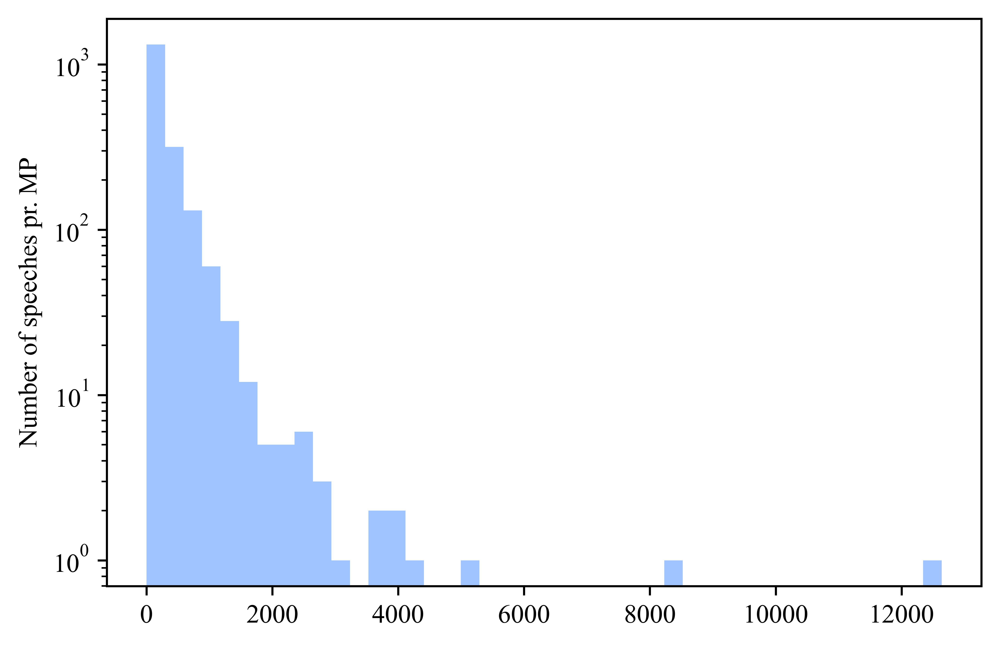

In [16]:
num_speeches = ParlaMint["Speaker_name"].value_counts()
fig, ax = plt.subplots(dpi = 1000)
ax.hist(num_speeches, bins = int(np.sqrt(len(num_speeches))), color = "#a0c4ff")
ax.set_ylabel("Number of speeches pr. MP")
ax.set_yscale("log")
fig.savefig("num_speeches.png")
plt.show()

From this plot it is apparent that the number of addresses each MP makes follows a power law. Prominent politicians are required to be more active in the houses as seen from the top ten speaker that consist of 2 speakers of the house, 2 prime ministers and the rest being ministers. 

Next up is a exploration of the activity in the two houses.

In [17]:
house_df = ParlaMint.groupby(by = ["From", "House"]).count()
house_df = house_df.iloc[:,0]
house_df = house_df.reset_index()
house_df = house_df.rename(columns = {"ID":"Count"})
house_df['From'] = pd.to_datetime(house_df['From'])

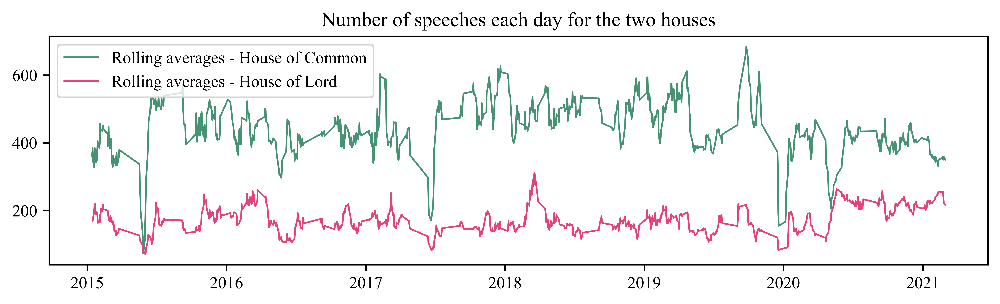

In [22]:
rolling_lower = house_df["Count"][house_df["House"] == "Lower house"].rolling(7).mean()
rolling_upper = house_df["Count"][house_df["House"] == "Upper house"].rolling(7).mean()
myFmt = mdates.DateFormatter("%b %Y")
fig, ax = plt.subplots(figsize=(10,2.5), dpi = 1000)
ax.plot(house_df["From"][house_df["House"] == "Lower house"], rolling_lower, label = "Rolling averages - House of Common", color = color_list[3])
ax.plot(house_df["From"][house_df["House"] == "Upper house"], rolling_upper, label = "Rolling averages - House of Lord", color = color_list[5])
ax.set_title("Number of speeches each day for the two houses")
fig.savefig("house_speeches.png")
ax.legend()
plt.show()

There is a clear distinction in the activity of the two houses. A hypothesis of why is that the house of common is elected each term and the primary goal of this house is to debate political topics and propose new laws. The lords are appointed and their primary goals are shaping laws and challenging the work of the government.  

In [6]:
gender_df = ParlaMint.groupby(by = ["From", "Speaker_gender"]).count()
gender_df = gender_df.iloc[:,0]
gender_df = gender_df.reset_index()
gender_df = gender_df.rename(columns = {"ID":"Count"})
gender_df['From'] = pd.to_datetime(gender_df['From'])

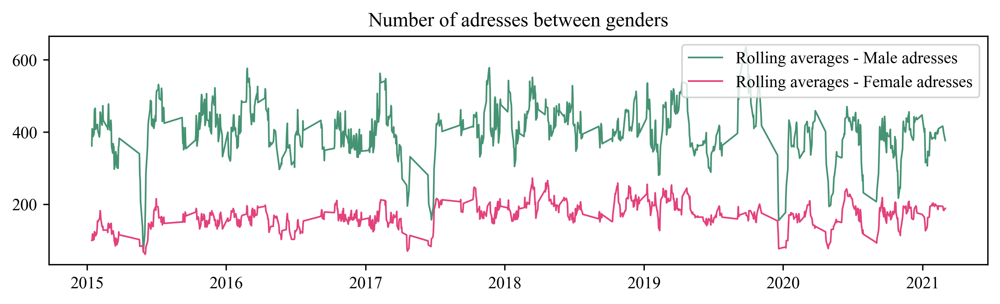

In [7]:
rolling_male = gender_df["Count"][gender_df["Speaker_gender"] == "M"].rolling(7).mean()
rolling_female = gender_df["Count"][gender_df["Speaker_gender"] == "F"].rolling(7).mean()
myFmt = mdates.DateFormatter("%b %Y")
fig, ax = plt.subplots(figsize=(10,2.5), dpi = 400)
ax.plot(gender_df["From"][gender_df["Speaker_gender"] == "M"], rolling_male, label = "Rolling averages - Male adresses", color = color_list[3])
ax.plot(gender_df["From"][gender_df["Speaker_gender"] == "F"], rolling_female, label = "Rolling averages - Female adresses", color = color_list[5])
ax.set_title("Number of adresses between genders")
fig.savefig("gender.png")
ax.legend()
plt.show()

Based exclusively on the number of adresses it seems that the activities in the houses still are highly male dominated. 

### The ten characteristics of big data

After this initial analysis of the data and its structure some of the ten characteristics of big data becomes apparent. In this section some of the most relevant characteristics are explored and used to highlight important distinctive features of the dataset.

* **Dirty:** As previously shown the data contained a "dirty" feature, the "Party_status". This highlight that the dataset is susceptible to being dirty since the data originally is manually collected by the stenographer that afterwards is archived. 
* **Always-on:** Since the British government makes this data publicly available, this project could be updated with the latest debates in the houses. However,  the newer data foundation will have another data structure, so new preprocessing code will have to be delveloped to encompass this. 
* **Incomplete:** As with most datasets, the metadata can always be expanded. In this case, the relation to the topic or bill is missing. Also if the speaker is pro or against the proposed bill. 


### Sentiment analysis

For the basis of the sentiment analysis of the speeches in parliament, a dictionary-based sentiment analysis was applied. Here a predefined dictionary with happiness scores associated with the 10222 most commonly used words in the English dictionary is used to explore if sentiment analysis can highlight any underlying structures of the British parliament.

Firstly the Hedonmeter file containing the happiness scores is loaded in.

In [8]:
# Load in Hedonmeter
labMT = pd.read_csv("../Week_7/Hedonometer.csv")
labMT.head()

,Rank,Word,Word in English,Happiness Score,Standard Deviation of Ratings
0,0,laughter,laughter,8.50,0.93
1,1,happiness,happiness,8.44,0.97
2,2,love,love,8.42,1.11
3,3,happy,happy,8.30,0.99
4,4,laughed,laughed,8.26,1.16


To see the distribution of happiness scores a histogram is used.

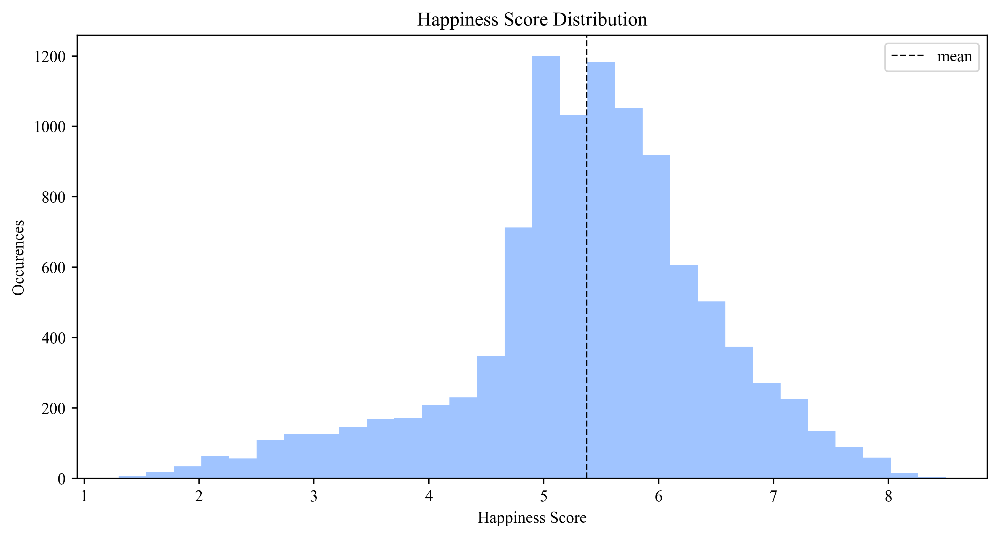

In [10]:
fig, ax = plt.subplots(figsize=(10,5), dpi = 400)
ax.hist(labMT["Happiness Score"].values, bins=30, color = "#a0c4ff")
ax.axvline(labMT["Happiness Score"].mean(), color='k', linestyle='dashed', linewidth=1, label="mean")
ax.set_title("Happiness Score Distribution")
ax.set_xlabel("Happiness Score")
ax.set_ylabel("Occurences")
ax.legend()
plt.show()

In [11]:
print(f'skewness of happiness scores: {skew(labMT["Happiness Score"].values)}')

skewness of happiness scores: -0.6087457806147994


The skewness measure indicate that the distribution have a moderately skewness to it. More specifically it shows that the distribution have a right sided tail. 

Next step is the creation of two function:

The first function *find_the_happiness* is based upon the formula: 
$$h_{avg}(T)=\sum_{i=1}^{N}h_{avg}(w_i)p_i$$
where $p_i = \frac{f_i}{\sum_{j=1}^{N}f_j}$ and $f_i$ is the frequency of the i'th word $w_i$.

The second function *preprocess* takes a text string as input and tokenizes it, filtering out stop words and punctuation. 

In [12]:
def find_the_happiness(tokens, happiness_df):
    # Initialize happiness
    avg_happiness = 0
    tokens = [word.lower() for word in set(tokens) if word.isalpha() and word in labMT["Word"].values]
    fdist = nltk.FreqDist(tokens)
    N = len(tokens)
    for token in tokens:
        p = fdist[token] / N
        avg_happiness += happiness_df['Happiness Score'][happiness_df['Word'] == token].item() * p
    return avg_happiness

def preprocess(text):
    #Common english stop words
    stop_words = set(stopwords.words('english'))
    #Tokenize using nltk
    word_tokens = word_tokenize(text.lower())
    #removing none letter characters and stop words
    filtered_sentence = [word for word in word_tokens if word not in stop_words and word.isalpha()]
    return filtered_sentence

In the following steps the data is tokenized.

In [21]:
ParlaMint["tokens"] = ParlaMint["Text"].progress_apply(lambda x: preprocess(x))

552103it [31:18, 293.87it/s]


In [22]:
# Create new column in datetime.date format based on the "From" column.
ParlaMint["date"] = ParlaMint["From"].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").date())

Since the data column describing if each speaker is a member of the coalition or opposition is filtered out the initial sentimental analysis is done on the two major parties from the coalition and the opposition. Namely the Labour party and the Conservative party.

In [23]:
labour_df = ParlaMint[ParlaMint["Speaker_party_name"] == "Labour"]
conservative_df = ParlaMint[ParlaMint["Speaker_party_name"] == "Conservative"]

In [24]:
token_pr_date_labour = labour_df.groupby("date").tokens.sum()
token_pr_date_conservative = conservative_df.groupby("date").tokens.sum()

In [25]:
labour_avg_token = np.mean([len(x) for x in token_pr_date_labour])
conservative_avg_token = np.mean([len(x) for x in token_pr_date_conservative])
print(f"Mean number for token pr date for Labour: {labour_avg_token}")
print(f"Mean number for token pr date for Conservative: {conservative_avg_token}")

Mean number for token pr date for Labour: 13827.087460484721
Mean number for token pr date for Conservative: 25141.098532494758


In [ ]:
token_pr_date_labour = token_pr_date_labour.to_frame()
token_pr_date_conservative = token_pr_date_conservative.to_frame()
token_pr_date_labour.columns = ["document"]
token_pr_date_conservative.columns = ["document"]

In [ ]:
# Now for the happiness
token_pr_date_labour["daily_happiness"] = token_pr_date_labour["document"].progress_apply(lambda x: find_the_happiness(x, labMT))

In [ ]:
token_pr_date_conservative["daily_happiness"] = token_pr_date_conservative["document"].progress_apply(lambda x: find_the_happiness(x, labMT))

Save the previous computations so they don't have to be repeated. 

In [ ]:
token_pr_date_labour.to_csv("data/token_pr_date_labour.csv")
token_pr_date_conservative.to_csv("data/token_pr_date_conservative.csv")

Load in the data if stored.

In [28]:
token_pr_date_labour = pd.read_csv("data/token_pr_date_labour.csv")
token_pr_date_conservative = pd.read_csv("data/token_pr_date_conservative.csv")
token_pr_date_labour["date"] = token_pr_date_labour["date"].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").date())
token_pr_date_conservative["date"] = token_pr_date_conservative["date"].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").date())
token_pr_date_labour.set_index("date", inplace = True)
token_pr_date_conservative.set_index("date", inplace = True)

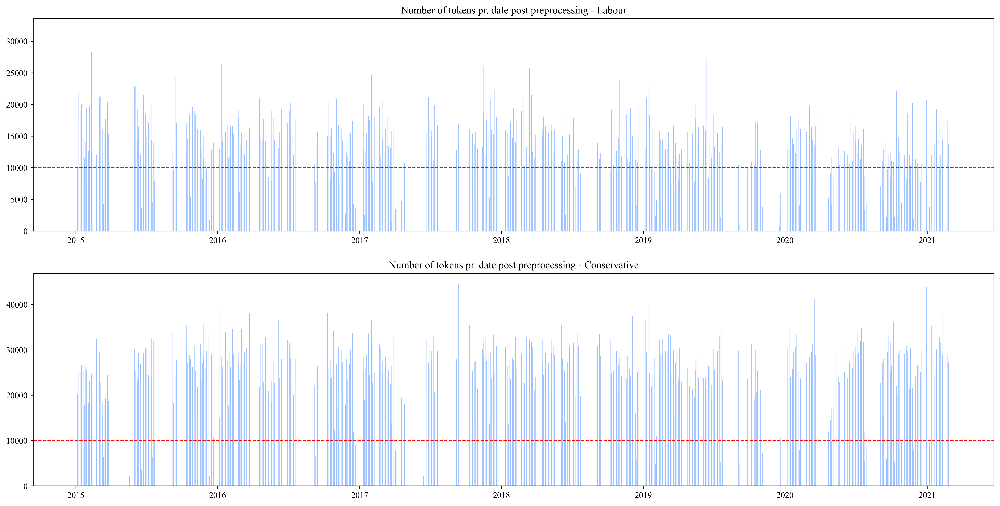

In [43]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20,10), dpi=1000)
ax1.bar(token_pr_date_labour.index, [len(ast.literal_eval(x)) for x in token_pr_date_labour["document"]], color = "#a0c4ff")
ax1.set_title("Number of tokens pr. date post preprocessing - Labour")
# Add some labels
ax1.axhline(10000, linestyle = "--", color = "r")

ax2.bar(token_pr_date_conservative.index, [len(ast.literal_eval(x)) for x in token_pr_date_conservative["document"]], color = "#a0c4ff")
ax2.set_title("Number of tokens pr. date post preprocessing - Conservative")
# Add some labels
ax2.axhline(10000, linestyle = "--", color = "r")

plt.show()

Since dictionary based methods need a large document size to work properly, it is seen from the above plot that especially the Labour document is on the limit of wheather the sentiment analysis yields a reliable result. With the Conservative document only a few days are below the recommended token size of 10000 words. This also reflect that over the entire period of the dataset, Conservative is the larger party.

Here some days of interest are highlighted. 

In [44]:
#Dates of note
election_days = [datetime.strptime("2015-05-07", "%Y-%m-%d").date(), datetime.strptime("2017-06-08", "%Y-%m-%d").date(), datetime.strptime("2019-12-12", "%Y-%m-%d").date()]
brexit_vote = datetime.strptime("2016-06-23", "%Y-%m-%d").date()
covid_lockdown = datetime.strptime("2020-03-23", "%Y-%m-%d").date()

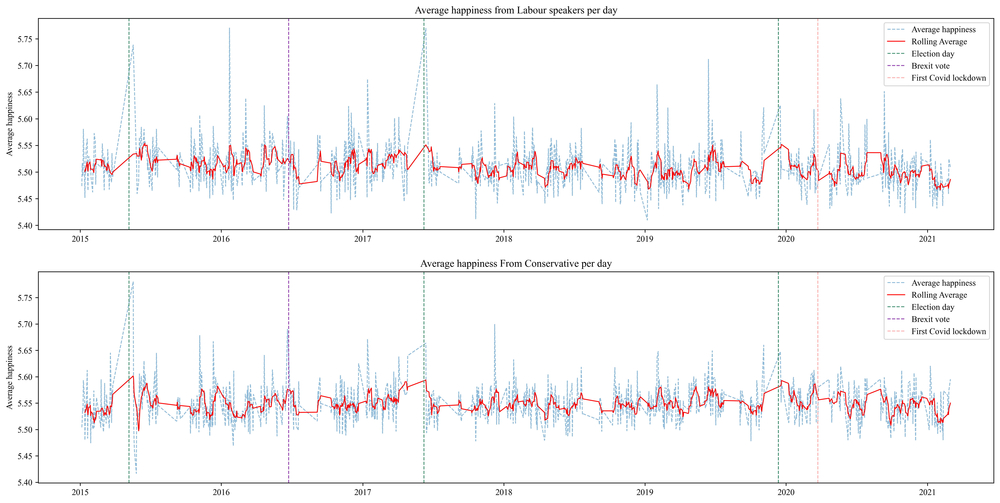

In [66]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20,10), dpi=400)
rolled_series = token_pr_date_labour["daily_happiness"].rolling(7).mean()
ax1.plot(token_pr_date_labour.index, token_pr_date_labour["daily_happiness"], ls = "--", alpha = 0.5, label='Average happiness')
ax1.plot(rolled_series.index, rolled_series.values, color = "r", label='Rolling Average')
for idx in range(len(election_days)):
    ax1.axvline(election_days[idx], ls = "--", color = color_list[3])
ax1.axvline(election_days[-1], label = "Election day", ls = "--", color = color_list[3])
ax1.axvline(brexit_vote, label = "Brexit vote", color = color_list[4], ls = "--")
ax1.axvline(covid_lockdown, label = "First Covid lockdown", color = color_list[9], ls = "--")
ax1.set_title("Average happiness from Labour speakers per day")
ax1.set_ylabel("Average happiness")
ax1.legend()

rolled_series2 = token_pr_date_conservative["daily_happiness"].rolling(7).mean()
ax2.plot(token_pr_date_conservative.index, token_pr_date_conservative["daily_happiness"], ls = "--", alpha = 0.5, label='Average happiness')
ax2.plot(rolled_series2.index, rolled_series2.values, color = "r", label='Rolling Average')
for idx in range(len(election_days)):
    ax2.axvline(election_days[idx], ls = "--", color = color_list[3])
ax2.axvline(election_days[-1], label = "Election day", ls = "--", color = color_list[3])
ax2.axvline(brexit_vote, label = "Brexit vote", color = color_list[4], ls = "--")
ax2.axvline(covid_lockdown, color = color_list[9], label = "First Covid lockdown", ls = "--")
ax2.set_title("Average happiness From Conservative per day")
ax2.set_ylabel("Average happiness")
ax2.legend()
fig.savefig("happiness_scores.png")
plt.show()

In [46]:
mean_labour_happiness = np.mean(token_pr_date_labour["daily_happiness"].values)
mean_conservative_happiness = np.mean(token_pr_date_conservative["daily_happiness"].values)
print(f"Mean Labour happiness score: {mean_labour_happiness}")
print(f"Mean Conservative happiness score: {mean_conservative_happiness}")

Mean Labour happiness score: 5.508579469270198
Mean Conservative happiness score: 5.5480341116436005


In [47]:
token_pr_date_labour["daily_happiness"].corr(token_pr_date_conservative["daily_happiness"])

0.5950086078205029

As seen from the plots and the mean happiness score for each party there are no great fluctuations, either overtime or between the two parties. This is mainly attributed to the text being in a highly formal setting and the words are chosen reflect that. Since most MP make use of this language, though they highly disagree on topics, it pushes the sentiment score towards the neutral 5. It is interesting, however, that the sentiment score is still above 5 in this setting, again showing support for the *Pollyanna hypothesis*.

A correlation of 0.595 between the happiness scores for each party indicates that the sentiment in the parliament follows at some level the same tendencies. This makes sense since there is a natural linkage between the topics addressed by MP in the chronological order the data is presented. Many topics of bills discussed in the house poses a problem where parties differ on which solution is most appropriate.

### Wordshifts

In the following section, the wordshifts for both the Conservative and Labour party will be explored. 

Originally this part of the analysis was intended for the Party status attribute (Coalition, Opposition), as it was hypothesised to yield a more distinctive separation of central word use related to the sentiment around certain events. Instead, two major parties were chosen.

As a major event the first COVID lockdown in UK was chosen. To create the wordshifts two lists are defined, one containing all the words say that day in a single document and a reference list that looks back in time.

In [48]:
max_h = token_pr_date_conservative["daily_happiness"].max()
date_max_h = pd.to_datetime("2020-03-23").date() # first COVID lockdown
d_max = date_max_h - timedelta(days = 14) # 7 days before as reference

In [49]:
l = ast.literal_eval(token_pr_date_labour["document"].loc[date_max_h])
l_ref = token_pr_date_labour["document"][((token_pr_date_labour.index <= date_max_h) & (token_pr_date_labour.index >= d_max))].values
l_ref = list(itertools.chain.from_iterable([ast.literal_eval(x) for x in l_ref]))

In [50]:
p = dict([(item[0], item[1]/len(l)) for item in Counter(l).items()])
p_ref = dict([(item[0], item[1]/len(l_ref)) for item in Counter(l_ref).items()])

print(f"{dict(itertools.islice(p.items(), 5))}")
print(f"\n{dict(itertools.islice(p_ref.items(), 5))}")

{'yesterday': 0.00015246226558926666, 'march': 0.00038115566397316664, 'marked': 7.623113279463333e-05, 'third': 0.0003049245311785333, 'anniversary': 0.00015246226558926666}

{'inform': 5.139439415645739e-05, 'house': 0.0035140917004477736, 'calling': 0.00017345608027804368, 'question': 0.0010600093794769336, 'leave': 0.0005974598320688171}


In [51]:
# Top 10 word used for the given day.
sorted(p.items(), key = lambda x: x[1], reverse = True)[:10]

[('government', 0.013264217106266199),
 ('people', 0.012883061442293033),
 ('hon', 0.006937033084311633),
 ('need', 0.006937033084311633),
 ('would', 0.0068608019515169994),
 ('house', 0.006479646287543833),
 ('bill', 0.0064034151547491995),
 ('right', 0.006022259490776033),
 ('minister', 0.0059460283579814),
 ('care', 0.005336179295624333)]

In [52]:
# Top 10 word used for the reference days.
sorted(p_ref.items(), key = lambda x: x[1], reverse = True)[:10]

[('government', 0.011313191013690181),
 ('people', 0.009655721802144432),
 ('would', 0.005415684284236697),
 ('minister', 0.0053899870871584685),
 ('need', 0.00536428989008024),
 ('many', 0.004683314167507179),
 ('hon', 0.004246461817177291),
 ('support', 0.004085854335438362),
 ('also', 0.0038288823646560753),
 ('one', 0.0038031851675778463)]

In [53]:
all_tokens = set(p.keys()).union(set(p_ref.keys())) # Set of the tokens that exist in both p and p_ref.
# dp show the difference between the two lists.
dp = dict([(token, p.get(token, 0) - p_ref.get(token, 0)) for token in all_tokens])
print(f"{dict(itertools.islice(dp.items(), 5))}")

{'fifteenfold': -6.4242992695571735e-06, 'dissent': -1.2848598539114347e-05, 'coventry': 1.1988140099061605e-05, 'joint': -9.080064821385317e-05, 'riverside': -6.424299269557173e-05}


In [54]:
#print top10
sorted(dp.items(), key = lambda x: x[1], reverse = True)[0:10]

[('people', 0.0032273396401486017),
 ('bill', 0.003184841220701056),
 ('measures', 0.003178074109303988),
 ('house', 0.0029655545870960593),
 ('hon', 0.0026905712671343417),
 ('right', 0.002604532279371617),
 ('staff', 0.0024637153417539012),
 ('workers', 0.0023279445986531476),
 ('must', 0.0020692517109907552),
 ('powers', 0.0020273806377365546)]

In [55]:
labMT_dict = dict(zip(labMT["Word"].values, labMT["Happiness Score"].values))
# Compute happiness for each word where all scores are shifted by -5
h = dict([(token, labMT_dict.get(token, np.nan) - 5) for token in all_tokens])

In [56]:
# Compute the product of delta p and h
dPhi = [(token, h[token] * dp[token]) for token in all_tokens if not np.isnan(h[token])]

In [57]:
# dPhi are the words that contributes most in the shifting of the happiness scores. 
sorted(dPhi, key = lambda x:np.abs(x[1]), reverse=True)[:10]

[('noble', -0.005808485276181414),
 ('women', -0.005556761896196173),
 ('bill', -0.004331384060153436),
 ('lord', -0.004070158887867544),
 ('right', 0.00401097971023229),
 ('house', 0.003973843146708719),
 ('people', 0.0037437139825723786),
 ('death', -0.003531085171858199),
 ('emergency', -0.003388856945273945),
 ('powers', 0.003365451858642681)]

C:\Users\Daniel\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\shifterator\plotting.py:604: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(x_ticks, fontsize=plot_params["xtick_fontsize"])


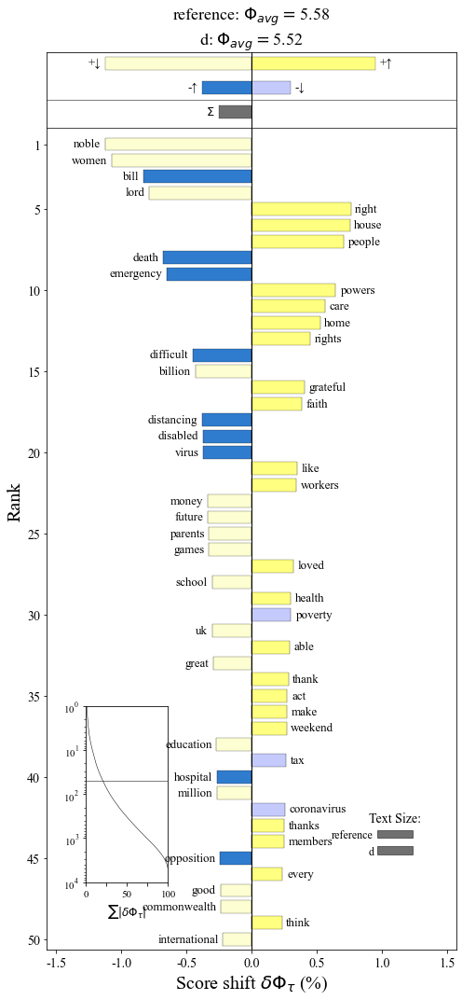

<AxesSubplot:title={'center':'reference: $\\Phi_{avg}=$5.58\nd: $\\Phi_{avg}=$5.52'}, xlabel='Score shift $\\delta \\Phi_{\\tau}$ (%)', ylabel='Rank'>

In [58]:
sentiment_sh = sh.WeightedAvgShift(type2freq_1 = p_ref, type2freq_2 = p, type2score_1 = labMT_dict, reference_value = 5)
sentiment_sh.get_shift_graph(detailed = True, system_names = ["reference", "d"])

Now the same procedure is used for the Conservative Party.

In [59]:
# For the Conservative party
l = ast.literal_eval(token_pr_date_conservative["document"].loc[date_max_h])
l_ref = token_pr_date_conservative["document"][((token_pr_date_conservative.index <= date_max_h) & (token_pr_date_conservative.index >= d_max))].values
l_ref = list(itertools.chain.from_iterable([ast.literal_eval(x) for x in l_ref]))
p = dict([(item[0], item[1]/len(l)) for item in Counter(l).items()])
p_ref = dict([(item[0], item[1]/len(l_ref)) for item in Counter(l_ref).items()])

print(f"{dict(itertools.islice(p.items(), 5))}")
print(f"\n{dict(itertools.islice(p_ref.items(), 5))}")

{'plans': 0.000250857095074839, 'mark': 8.361903169161301e-05, 'conclusion': 0.0007525712852245171, 'initial': 4.1809515845806506e-05, 'term': 0.00016723806338322602}

{'recent': 0.0003900756174109715, 'assessment': 0.0001717764186763911, 'made': 0.0029309351436659233, 'trends': 2.147205233454889e-05, 'number': 0.0015996678989238923}


In [60]:
# Top 10 word used for the given day.
sorted(p.items(), key = lambda x: x[1], reverse = True)[:10]

[('hon', 0.010786855088218078),
 ('government', 0.01015971235053098),
 ('right', 0.008403712685007107),
 ('bill', 0.0076093318839367844),
 ('house', 0.006480474956100008),
 ('people', 0.006313236892716782),
 ('friend', 0.005811522702567104),
 ('need', 0.005644284639183878),
 ('would', 0.005226189480725813),
 ('new', 0.004766284806421941)]

In [61]:
# Top 10 word used for the reference days.
sorted(p_ref.items(), key = lambda x: x[1], reverse = True)[:10]

[('hon', 0.009283083959303303),
 ('government', 0.0077299388404376),
 ('people', 0.007035675814953853),
 ('right', 0.006577605365150143),
 ('friend', 0.006380778218750112),
 ('noble', 0.00541095718830632),
 ('would', 0.004795425021382586),
 ('support', 0.004437557482473437),
 ('also', 0.0041369487497897525),
 ('need', 0.004029588488117008)]

In [62]:
all_tokens = set(p.keys()).union(set(p_ref.keys())) # Set of the tokens that exist in both p and p_ref.
# dp show the difference between the two lists.
dp = dict([(token, p.get(token, 0) - p_ref.get(token, 0)) for token in all_tokens])
print(f"{dict(itertools.islice(dp.items(), 5))}")
labMT_dict = dict(zip(labMT["Word"].values, labMT["Happiness Score"].values))
# Compute happiness for each word where all scores are shifted by -5
h = dict([(token, labMT_dict.get(token, np.nan) - 5) for token in all_tokens])
# Compute the product of delta p and h
dPhi = [(token, h[token] * dp[token]) for token in all_tokens if not np.isnan(h[token])]
# dPhi are the words that contributes most in the shifting of the happiness scores. 
sorted(dPhi, key = lambda x:np.abs(x[1]), reverse=True)[:10]

{'dissent': 3.4652165067623544e-05, 'coventry': 1.3180112733074651e-05, 'joint': 1.2220432829001035e-05, 'swiss': -7.157350778182964e-06, 'cowardly': -7.157350778182964e-06}


[('bill', -0.00628474759030174),
 ('noble', -0.005972010538499086),
 ('powers', 0.005361482445431507),
 ('coronavirus', -0.004195842758404184),
 ('care', 0.004154860308883938),
 ('health', 0.003995995253665583),
 ('women', -0.003841321991691592),
 ('house', 0.003413664342674549),
 ('act', 0.0033513985299882974),
 ('lord', -0.0029912874048966752)]

C:\Users\Daniel\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\shifterator\plotting.py:604: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(x_ticks, fontsize=plot_params["xtick_fontsize"])


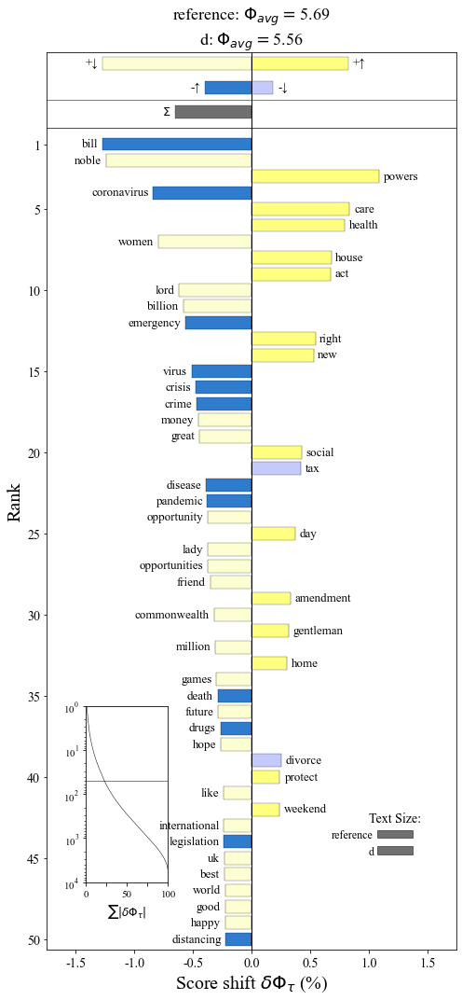

<AxesSubplot:title={'center':'reference: $\\Phi_{avg}=$5.69\nd: $\\Phi_{avg}=$5.56'}, xlabel='Score shift $\\delta \\Phi_{\\tau}$ (%)', ylabel='Rank'>

In [63]:
sentiment_sh = sh.WeightedAvgShift(type2freq_1 = p_ref, type2freq_2 = p, type2score_1 = labMT_dict, reference_value = 5)
sentiment_sh.get_shift_graph(detailed = True, system_names = ["reference", "d"])

Here it is seen that both parties are slightly down in happiness scores compared with the 14 days before it is referenced against. But what is interesting is perhaps not the score itself, but the change in word frequency that their wordshifts uncovers. 

For negative words that emerge more than the usual, bill is at the top for both parties. This is a natural finding as legislators are proposing and discussing bills that can relieve the situation. Another series of negative words that are up are words describing the consequences of the pandemic, like "death", "emergency", "distancing", "crisis" etc.  

The positive words (right side of the figure) tell how the politicians for the respective parties address this time of crisis and how they wish to inspire hope and unity in the population. 

### TF-IDF
The following section will make use of the text mining tool TF-IDF to try and distinguish important topics within different parties e.g. Liberals and Conservatives. Among other cool stuff that we will figure out on the fly.

First of all a new preprocess of the data is made, that in addition to remove stopwords also stems the tokens.

##### Data Fetch

In [8]:
#define topic list
topic_list = ['education', 'health', 'eu', 'immigration', 'crime',
             'pandemic', 'vaccine', 'world', 'environment',
             'economy', 'legislation', 'employment', 'transport', 'tax', 'pension', 'welfare', 'defence','test']
porter = nltk.PorterStemmer()
topic_list = [porter.stem(x) for x in topic_list]

In [ ]:
def preprocess(text):
    #Common english stop words
    stop_words = set(stopwords.words('english'))
    #Tokenize using nltk
    word_tokens = word_tokenize(text.lower())
    #removing none letter characters and stop words
    filtered_sentence = [w for w in word_tokens if w not in stop_words and w.isalpha()]
    #Conduct stemming
    processed_text = [porter.stem(t) for t in filtered_sentence]
    return processed_text
    
ParlaMint['tokens'] = [preprocess(x) for x in ParlaMint['Text']] 

In [ ]:
# Save data to avoid multiple preprocesses
ParlaMint.to_csv('parlamint_preprocess.csv')

In [10]:
# Read data if preprocessed before
ParlaMint = pd.read_csv("parlamint_preprocess.csv")
ParlaMint.head()

,Unnamed: 0,ID,Title,From,To,House,Term,Subcorpus,Speaker_role,Speaker_type,Speaker_party,Speaker_party_name,Party_status,Speaker_name,Speaker_gender,Speaker_birth,Text,tokens
0,0,ParlaMint-GB_2015-01-05-commons.u1,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,LD,Liberal Democrat,Coalition,"Willott, Jennifer Nancy",F,-,1. What progress her Department has made on im...,"['progress', 'depart', 'made', 'implement', 'e..."
1,1,ParlaMint-GB_2015-01-05-commons.u2,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,CON,Conservative,Coalition,"May, Theresa Mary",F,-,The Government are on track to deliver their c...,"['govern', 'track', 'deliv', 'commit', 'introd..."
2,2,ParlaMint-GB_2015-01-05-commons.u3,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,LD,Liberal Democrat,Coalition,"Willott, Jennifer Nancy",F,-,"It is clear that exit checks, which were scrap...","['clear', 'exit', 'check', 'scrap', 'previou',..."
3,3,ParlaMint-GB_2015-01-05-commons.u4,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,CON,Conservative,Coalition,"May, Theresa Mary",F,-,"As I indicated in my original answer, we are o...","['indic', 'origin', 'answer', 'track', 'ensur'..."
4,4,ParlaMint-GB_2015-01-05-commons.u5,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,LAB,Labour,Opposition,"Cunningham, Alexander",M,-,19. Given the situation at our border in Calai...,"['given', 'situat', 'border', 'calai', 'home',..."


In [11]:
# Convert tokens to list
ParlaMint['tokens'] = ParlaMint['tokens'].apply(lambda x: ast.literal_eval(x)) 

##### Data manipulations
Each observation in the dataframe consist of a specific speach associated with metadata e.g. speaker name, speaker party etc. Initially, we will create one document for each party by concatenating all of the speaches conducted by the members of the same parties. This would yield a corpus consisting of:

In [24]:
print(f'Number of documents in the corpus: {len(ParlaMint.Speaker_party_name.unique())-1}')

Number of documents in the corpus: 47


We subtract the count with one given that one party simply is NaN, thereby resulting in 47 documents. Furthermore, it should also be noticed that some of the 47 documents do not exclusively consist of transcripts from one single party, but is transcripts that are assigned to multiple parties due to interruptions and debates from members of different parties.

In [13]:
corpus_sklearn = []
stopwords = ['hon', 'nobl', 'baro', 'uk']
parties = ParlaMint.Speaker_party_name.dropna().unique()
for party in tqdm(parties):
    temp = ParlaMint[ParlaMint['Speaker_party_name']==party]
    doc = [x for sublist in temp['tokens'] for x in sublist if x not in stopwords]
    corpus_sklearn.append(doc)


100%|███████████████████████████████████████████| 47/47 [00:22<00:00,  2.06it/s]


We now have a document for each party in addition to some documents that consist of multiple parties. Thereby, resulting in a corpus of 47 documents. The next step is to compute the TF-IDF weightings of all terms in the corpus. 

In [2]:
def TFIDF(corpus: list, min_df=0, max_df=1) -> DataFrame:
    '''
    corpus: A list of lists containing tokenized documents
    min_df: Threshold for removal of non-frequent words
    max_df: Threshold for removal of very frequent words

    The following function calculates and outputs the TF-IDF weighted term-document matrix.
    Notice that the IDF formulation used in this function deviates from the standard text book formula:
     * Adding 1 to the IDF ensures that terms with zero idf e.g. terms occuring in all documents are not completly ignored.
     * Hence, using idf(t) = log [ n / df(t) ] + 1 instead of idf(t) = log [ n / (df(t) + 1) ]).
    Furthermore, the IDF is also smoothened to avoid division by zero, by essentially pretendind that an extra document is added containing all terms to avoid division by zero:
     * idf(t) = log [ (n+1) / df(t+1) ] + 1
    '''
    N = len(corpus)

    if min_df != 0 or max_df != 1:
        term_set = set([x for sublist in corpus for x in sublist])
        doc_freq = dict.fromkeys(term_set, 0)
        for term in term_set:
            for doc in corpus:
                if term in doc:
                    doc_freq[term] += 1
        doc_freq = {key: value/N for (key, value) in doc_freq.items()}
        term_set = set([term for (term, value) in doc_freq.items() if value < max_df and value > min_df])
    else:
        term_set = set([x for sublist in corpus for x in sublist])

    idf_dict = dict.fromkeys(term_set, 0)
    tfidf_dicts = [None] * N
    tf_dicts = [None] * N
    idx = 0
    for doc in corpus:
        tf_dict = dict.fromkeys(term_set, 0)
        tf_dict.update({key: value/len(doc) for (key, value) in dict(FreqDist(doc)).items() if key in term_set}) #Normalized frequencies
        tf_dicts[idx] = tf_dict
        for (term, freq) in tf_dict.items():
            if freq > 0:
                idf_dict[term] += 1
        idx += 1

    idf_dict = {term: np.log( (N + 1) / (float(value) + 1)) + 1 for (term, value) in idf_dict.items()}
    for i in range(N):
        tf_dict = tf_dicts[i]
        temp = {term: tf_dict[term] * idf_dict[term] for term in term_set}
        tfidf_dicts[i] = {term: value / (np.sqrt(sum([x**2 for x in list(temp.values())]))) for (term, value) in temp.items()} #Converting to unit norm with l2

    return pd.DataFrame(tfidf_dicts)

Due to the amount of data this implementation is very time consuming. Therefore, the rest of the analysis will make use of Sklearns vectorized TF-IDF implmentation. However, we will first demonstrate that the two implementations yield the same results. 

### Our implementation

In [5]:
test = [["this", "is", "is", "a"],["test", "a"]]
TDM = TFIDF(test)
TDM

,a,test,this,is
0,0.303216,0.000000,0.42616,0.852319
1,0.579739,0.814802,0.00000,0.000000


### Sklearn's implementation

In [7]:
def dummy_fun(doc):
    return doc
vectorizer = TfidfVectorizer(analyzer='word',
    tokenizer=dummy_fun,
    preprocessor=dummy_fun,
    token_pattern=None)
vecs = vectorizer.fit_transform(test)
feature_names = vectorizer.get_feature_names()
dense = vecs.todense()
lst1 = dense.tolist()
df = pd.DataFrame(lst1, columns=feature_names).dropna()
df

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,a,is,test,this
0,0.303216,0.852319,0.000000,0.42616
1,0.579739,0.000000,0.814802,0.00000


By comparing the result from the two implementations, it can be seen that the estimated TF-IDF weights are equivalent. Also note that the technical details of how TF-IDF was implemented can be found in the doc string of our own implementation. The most important detail, is that we deviates from the traditional text book formulation by introducing smoothing and also added one to the IDF estimate.
<br />

In the following section, sklearn's implementation of TF-IDF will be used to determine the TF-IDF representation of the 47 documents. Subsequently, the representations will be visualized using WordClouds. Furthermore, the initial WordClouds demonstrated that the IDF weighting was not quite enough to alleviate the issue with the disproportional importance of frequent words. Therefore, an upper and lower threshold was introduced to remove words that are in more than 70 % of the documents and less than 10 % of the documents. 

In [14]:
def dummy_fun(doc):
    return doc
vectorizer = TfidfVectorizer(min_df=5, max_df = 0.7, analyzer='word',
    tokenizer=dummy_fun,
    preprocessor=dummy_fun,
    token_pattern=None)
vecs = vectorizer.fit_transform(corpus_sklearn)
feature_names = vectorizer.get_feature_names()
dense = vecs.todense()
lst1 = dense.tolist()
df = pd.DataFrame(lst1, columns=feature_names).dropna()
df.index = parties

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [15]:
df

,aa,aarhu,aaron,ababa,aback,abandon,abat,abattoir,abba,abbey,...,zuckerberg,zurich,à,ça,école,être,í,ís,ó,šefčovič
Liberal Democrat,0.000354,0.000614,0.000048,0.000678,0.000630,0.012481,0.000872,0.001256,0.000194,0.000884,...,0.000253,0.000318,0.000212,0.000056,0.000056,0.000455,0.000112,0.000056,0.000000,0.000000
Conservative,0.000477,0.000121,0.000270,0.000172,0.000315,0.004307,0.000375,0.000684,0.000517,0.001029,...,0.000133,0.000172,0.000172,0.000043,0.000009,0.000203,0.000086,0.000060,0.000009,0.000337
Labour,0.000559,0.000126,0.000302,0.000192,0.000343,0.011041,0.000604,0.000501,0.000494,0.000738,...,0.000272,0.000270,0.000120,0.000032,0.000047,0.000186,0.000047,0.000016,0.000000,0.000063
Scottish National Party,0.000116,0.000321,0.000111,0.000056,0.000278,0.008810,0.000334,0.000000,0.000000,0.001231,...,0.000116,0.000183,0.000000,0.000257,0.000000,0.000000,0.000257,0.000064,0.000064,0.000064
UK Independence Party,0.000000,0.000000,0.000000,0.000000,0.000000,0.012398,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Green Party,0.000000,0.000000,0.000783,0.000000,0.000000,0.011134,0.000000,0.000753,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Plaid Cymru,0.000393,0.000000,0.000000,0.000000,0.000000,0.006521,0.000754,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.001180,0.000000,0.000000,0.000000,0.000000
Democratic Unionist Party,0.000000,0.000000,0.000495,0.000165,0.000495,0.003160,0.000165,0.000475,0.000330,0.003645,...,0.000000,0.000000,0.000722,0.000000,0.000000,0.000861,0.000570,0.000190,0.003610,0.000190
-,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.001913,0.000000,0.000000,0.000000,0.000000,0.000000
Social Democratic & Labour Party,0.000000,0.000000,0.000000,0.000000,0.000000,0.009956,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


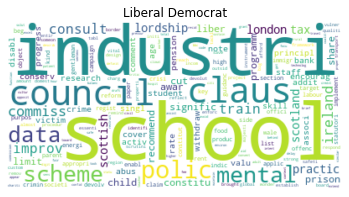

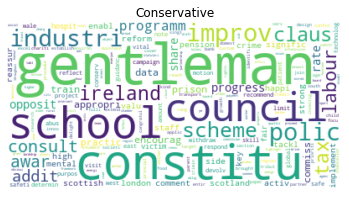

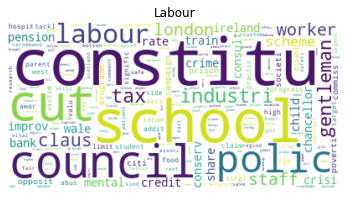

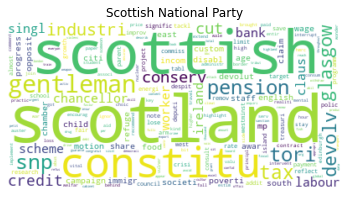

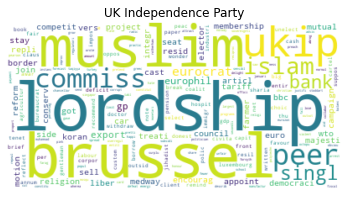

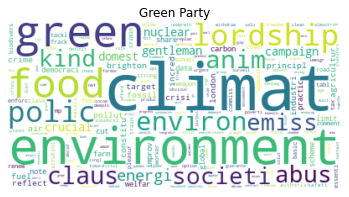

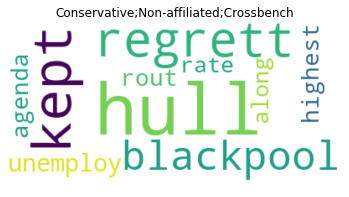

In [19]:
for i in range(len(df)):
    Cloud = WordCloud(background_color='white').generate_from_frequencies(df.iloc[i,:])
    plt.imshow(Cloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'{df.index[i]}')
    plt.savefig(f'clouds/wordcloud_{df.index[i]}.pdf', dpi = 200)
    if i < 6:
        plt.show()

### Party similarity (TF-IDF & Cosine similarity)
Once the term-document matrix with TF-IDF weighting have been determined, the cosine similarity between each document can be used to determine similarity between documents, and thereby between parties.

In [20]:
subset_parties = ['Liberal Democrat', 'Conservative', 'Labour', 'Scottish National Party', 'UK Independence Party']

In [21]:
term_doc_matrix = df.loc[subset_parties].to_numpy()
term_doc_matrix

array([[3.53982627e-04, 6.13579102e-04, 4.84354663e-05, ...,
        5.57799184e-05, 0.00000000e+00, 0.00000000e+00],
       [4.77258880e-04, 1.20822046e-04, 2.69777833e-04, ...,
        6.04110229e-05, 8.63014612e-06, 3.36575699e-04],
       [5.58788720e-04, 1.26434902e-04, 3.01915411e-04, ...,
        1.58043628e-05, 0.00000000e+00, 6.32174511e-05],
       [1.16296259e-04, 3.20700562e-04, 1.11389774e-04, ...,
        6.41401125e-05, 6.41401125e-05, 6.41401125e-05],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

Given that sklearns TFIDF vectorizer already normalizes the rows using l2 norm, the cosine similarity can simply determined as follows:

In [22]:
sim_matrix = (term_doc_matrix @ term_doc_matrix.T)

Let's depict the similarity matrix using a heatmap:

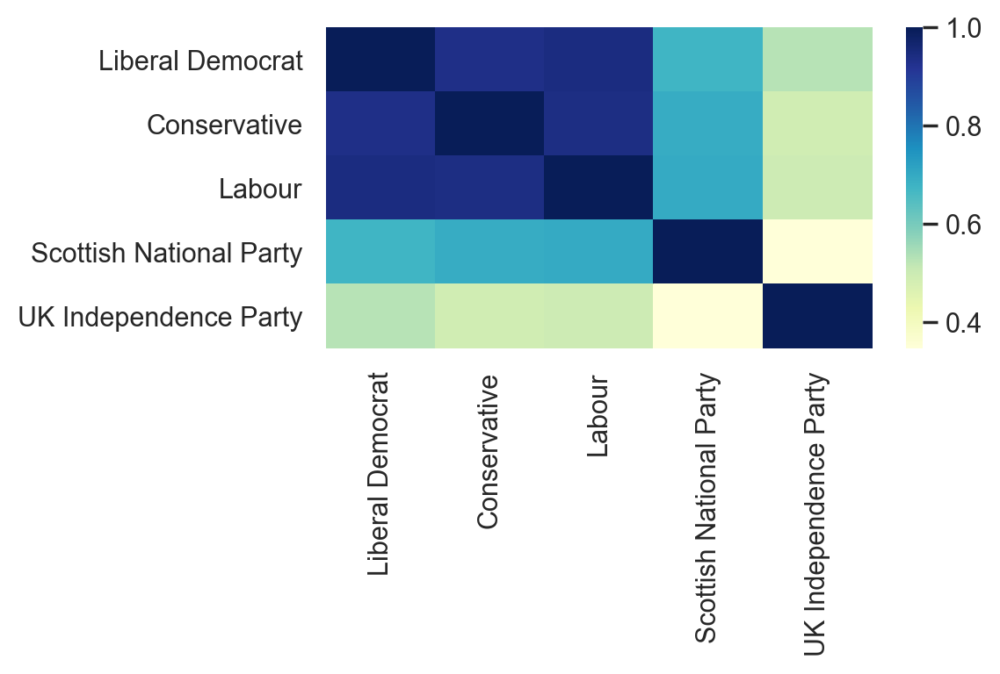

In [23]:
import seaborn as sns; sns.set_theme()
fig, ax = plt.subplots(dpi=200)
sns.heatmap(sim_matrix, xticklabels=subset_parties ,yticklabels=subset_parties, cmap="YlGnBu")
plt.tight_layout()
plt.savefig('Party_similarity.pdf', dpi=200)

### Temporal Text Analysis

##### Bubble plots- lexical dispersion plots

The following section will display lexical dispersion plots of the topics in the British Parliament with a unique style. Notice that we had to alter the typical lexical dispersion plot slightly, primarily because most topics are to some degree always mentioned making it difficult to see the variation in the nltk implementation. The alteration consists of making the size of the marker proportional with the frequency. 

In the following implementation, a document is created pr. day by joining the speeches into a single string for that specific day. Instead of using a regular expression pattern to find occurrences of the chosen term, we decided to tokenise the joined string and remove all tokens that are not equal to the term. The described procedure is repeated for each of the chosen terms. Consequently, a frequency pr. day for each term is computed.

In [26]:
import plotly.io as pio

def word_frequency(word, start_date, end_date, ParlaMint):

    ParlaMint['date'] = pd.to_datetime(ParlaMint['From'])
    mask = (ParlaMint['date'] > start_date) & (ParlaMint['date'] <= end_date)
    ParlaMint = ParlaMint.loc[mask]
    dates = ParlaMint["date"].unique()
    freq_pr_day = {}
    for date in dates:
        temp = ParlaMint[ParlaMint['date']==date]
        doc = ' '.join(temp['Text']).lower()
        freq_pr_day[date] = len([x for x in nltk.tokenize.word_tokenize(doc.lower()) if x ==word])
    df = pd.DataFrame.from_dict(freq_pr_day, orient='index', columns=['count']).fillna(0)
    df['date'] = df.index
    return df

def create_bubblelines(words, start_date, end_date, ParlaMint):
    '''
    https://github.com/wragge/hansard-language/blob/3f6c954d8fcc519bbde366241b6de84e3ca7cd58/analysis.py#L863
    '''
    traces = []
    for word in tqdm(words):
        dates = []
        counts = []
        labels = []
        text = []
        results = word_frequency(word, start_date, end_date, ParlaMint)
        for i in range(len(results)):
            dates.append(results.iloc[i,:]['date'])
            counts.append(results.iloc[i,:]['count'])
            text.append('{} uses'.format(results.iloc[i,:]['count']))
            labels.append(word)
        trace = dict(
            type='scatter',
            x=dates,
            y=labels,
            text=text,
            mode='markers',
            marker=dict(
                size=counts,
                opacity=0.4,
                sizemode="area"
            ),
            hoverinfo='x+text'
        )
        traces.append(trace)
    layout = go.Layout(
        yaxis=dict(
            tickfont=dict(
                size=10
            )
        ),
        margin=dict(
            l=120,
            r=80,
            t=100,
            b=100
        ),
        showlegend=False
    )
    figure = dict(data=traces, layout=layout)
    return figure
words = ['education',
 'health',
 'eu',
 'immigration',
 'crime',
 'pandemic',
 'vaccine',
 'world',
 'environment',
 'economy',
 'legislation',
 'employment',
 'transport',
 'tax',
 'pension',
 'welfare',
 'defence',
 'test']

start_date = "2020-01-01" 
end_date = "2020-12-30"

fig = create_bubblelines(words, start_date, end_date, ParlaMint)
pio.show(fig)


100%|██████████████████████████████████████████| 18/18 [31:40<00:00, 105.59s/it]


#### Trend Plots
Below this cell, we will investigate some different temporal relations using plotly and raceplotly. We decided to collect dates into months because there was so much daily variation in topic mentions. For comments on these plots, we refer you to our website.

In [ ]:
#load data
column_names = ['ID', 'Title', 'From', 'To', 'House', 'Term', 'Session', 'Meeting',
       'Sitting', 'Agenda', 'Subcorpus', 'Speaker_role', 'Speaker_type',
       'Speaker_party', 'Speaker_party_name', 'Party_status', 'Speaker_name',
       'Speaker_gender', 'Speaker_birth', "Text"]
ParlaMint = pd.read_csv("data/parlamint.csv", index_col=False, usecols = column_names)
ParlaMint['From'] = pd.to_datetime(ParlaMint['From'])
ParlaMint['month'] = ParlaMint['From'].dt.strftime('%Y-%m')

In [2]:
#Get months
list_of_months = ParlaMint.month.unique()
#Make topic list and stem it.
topic_list = ['education', 'health', 'eu', 'immigration', 'crime',
             'pandemic', 'vaccine', 'world', 'environment',
             'economy', 'legislation', 'employment', 'transport', 'tax', 'pension', 'welfare', 'defence','test']
from nltk.tokenize import word_tokenize
porter = nltk.PorterStemmer()
topic_list = [porter.stem(x) for x in topic_list]

In [ ]:
#Preprocessing
from nltk.tokenize import word_tokenize
porter = nltk.PorterStemmer()
topic_list = [porter.stem(x) for x in topic_list]
day_dict = {}
for i in tqdm(list_of_months):
    tokens = word_tokenize((' '.join(ParlaMint[ParlaMint.month==i]['Text'])).lower())
    temp = nltk.FreqDist([porter.stem(x) for x in tokens if porter.stem(x) in topic_list])
    norm_const = sum(temp.values())
    norm_freqs = {key: value/norm_const for (key,value) in temp.items()}
    day_dict[i] = norm_freqs 
fd_topic = pd.DataFrame.from_dict(day_dict, orient='index')
fd_topic = fd_topic.fillna(0) #nan means noone mentioned it the given day
fd_topic = fd_topic.reset_index()
fd_topic2 = fd_topic.rename(columns={"index": "month"})
fd_topic = pd.melt(fd_topic2, id_vars='month', value_vars=topic_list)
fd_topic.to_csv('fd_topic_vaccine.csv',sep=',')


In [2]:
#Get the file here instead ;)
fd_topic = pd.read_csv('fd_topic_vaccine.csv')
fd_topic2 = pd.pivot(fd_topic, index='month', columns='variable')['value']

In [3]:
#Create a smart race plot! ;)
import raceplotly
from raceplotly.plots import barplot

bar = barplot(fd_topic, item_column='variable', value_column = 'value', time_column = 'month')

In [5]:
bar.plot(item_label = 'Top 10 topics', value_label = 'Topic Mentions per Month', frame_duration = 1200)

In [6]:
#Get the same plot but with rolling averages (rolling in quarters - 3 months)
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
fd_topic = fd_topic.sort_values('month')
fd_topic['month'] = pd.to_datetime(fd_topic['month'])
fd_topic = fd_topic.rename(columns={'variable': 'topics','value': 'normalised frequency'})
topics_to_hide = [i for i in topic_list if i not in ['pandem', 'test']]
fig = px.scatter(fd_topic, x="month", y="normalised frequency", color="topics",
                 trendline="rolling", trendline_options=dict(window=3),
                hover_name="topics", hover_data={'month':False, 'topics':False})
fig.update_layout(hovermode='x unified',
    hoverlabel=dict(
        bgcolor='rgb(240,248,255)',
        font_size=12
    )
)
#Only if you dont want to show it all at first!
fig.for_each_trace(lambda trace: trace.update(visible="legendonly") 
                   if trace.name in topics_to_hide else ())
#
fig.update_layout(legend_orientation="h",xaxis_title = '') #Remove xlabels ;)
fig.show()
fig.write_json("lineplots.json")

In [7]:
#Create a correlation heatmap
corm = fd_topic2.corr()
fig = px.imshow(corm)
fig.update_layout(legend_orientation="h",xaxis_title = '')
fig.show()
fig.write_json("heatmap.json")

In [8]:
#Show some of the interesting correlations in a scatter matrix!
fd_topic2 = fd_topic2.reset_index()
df_scatter = pd.concat([fd_topic2['month'],fd_topic2['environ'], fd_topic2['tax'], fd_topic2['transport']],1)

df_scatter['month']=pd.to_datetime(df_scatter['month'],format='%Y-%m')
df_scatter['year'] = pd.DatetimeIndex(df_scatter['month']).year



fig = px.scatter_matrix(df_scatter, 
                        dimensions=["environ", "tax", "transport"],
                        color = 'year')
fig.update_traces(diagonal_visible=False)
fig.update_layout(
    hoverlabel=dict(
        bgcolor='rgb(240,248,255)',
        font_size=12
    )
)
fig.show()
fig.write_json('corrplot.json')

<ipython-input-8-11e5916191dc>:3: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.



In [9]:
#Show general topic trends with linear regression
fd_topic.rename(columns={'variable':'topics','value':'normalised frequency'}, inplace=True)
topics_to_hide = [i for i in topic_list if i not in ['tax', 'environ']]
fd_topic['month'] = pd.to_datetime(fd_topic.month)
fig = px.scatter(fd_topic, x="month", y="normalised frequency",
                 color='topics', trendline="ols",hover_name="topics", 
                 hover_data={'month':False, 'topics':False})
fig.update_layout(hovermode='x unified',
    hoverlabel=dict(
        bgcolor='rgb(240,248,255)',
        font_size=12
    )
)
fig.update_traces(hovertext='topics',
    hovertemplate=f'<b><b>')
#Only if you dont want to show it all at first!
fig.for_each_trace(lambda trace: trace.update(visible="legendonly") 
                   if trace.name in topics_to_hide else ())
#
fig.update_layout(legend_orientation="h",xaxis_title = '') #Remove xlabels ;)
fig.show()
fig.write_json('ols.json')

/Users/felixburmester/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Users/felixburmester/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning:

pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



## Network Analysis
#### Network Analysis of the British Parliament Speeches

###### Disclaimer: We have not run this part of the notebook a final time (because it would take too long). Instead, we have posted the images from our plots saved previously. - Sorry

The following section will attempt to analyse the political activity within the British Parliament by leveraging the results of the topic and text analysis of the speeches from the previous section combined with methods from the network science field.

The first step in the analysis is to construct a network using the speech transcripts and associated metadata, which can be found in the data section. One possible approach for constructed the network is to create a bipartite network with one partition being the members of the Parliament and the other partition being political topics discovered in the text analysis section. Hence, constructing a network that tries to model the relationship between politicians and political topics based on their speeches conducted in the Parliament. Furthermore, to model the relationship within each partition, it is possible to project the initial bipartite graph into two distinct network as depicted in the following visualization:

![](images/graph_construct.png)


Thus, creating a network consisting of the members of the Parliament and a network consisting of the political topics. In the projected network with Parliament members, two members share an edge if they had a common neighbour in the bipartite network. Furthermore, the weight of each edge corresponds to the number of mutual neighbours of the two nodes in the bipartite network.

### Load Data

In [ ]:
#load data
column_names = ['ID', 'Title', 'From', 'To', 'House', 'Term', 'Session', 'Meeting',
       'Sitting', 'Agenda', 'Subcorpus', 'Speaker_role', 'Speaker_type',
       'Speaker_party', 'Speaker_party_name', 'Party_status', 'Speaker_name',
       'Speaker_gender', 'Speaker_birth', "Text"]
ParlaMint = pd.read_csv("data/parlamint.csv", index_col=False, usecols = column_names)
ParlaMint['From'] = pd.to_datetime(ParlaMint['From'])

In [ ]:
ParlaMint = pd.read_csv('parlamint_preprocess.csv')
porter = nltk.PorterStemmer()
topic_list = [porter.stem(x) for x in topic_list]
import ast
ParlaMint['tokens'] = ParlaMint['tokens'].apply(lambda x: ast.literal_eval(x)) 

In [ ]:
doc_pr_mp = ParlaMint.groupby('Speaker_name').tokens.sum()[1:] #First element is not a parliament member

### Modelling
The first step is to create the bipartite network. The relations between members of the Parliament and the chosen topics were determined by assessing which topics a given member mentions sufficiently frequent in their speeches. This was accomplished by simply counting the frequency distribution of topics for each Parliament member and using one standard deviation as a threshold for determining when a topic is mentioned sufficiently frequent.

Hence, for each member of the Parliament, an edge is drawn from the member to a topic, if the frequency of the topic is more than one standard deviation away from the average topic frequency for that particular Parliament member.

In the following section the bipartite graph is constructing using the described approach. Subsequently, it is visualized using the netwulf library for graph visualizations.

In [ ]:
BG = nx.Graph()
#Draw nodes in partitions
BG.add_nodes_from(ParlaMint.Speaker_name.unique(), bipartite=0)
BG.add_nodes_from(topic_list, bipartite=1)

In [ ]:
def draw_edges(BG: nx.Graph, doc: list, mp: str, stemmed_topic_list):
    freq = dict(nltk.FreqDist([x for x in doc if x in stemmed_topic_list]))
    #Trying to make local avg_dict instead because some people may just hold more speeches
    for topic in freq.keys():
        if freq[topic] >= np.mean(list(freq.values())) + 1 * np.std(list(freq.values())):
            freq = {term: (val/(sum(freq.values()))) for (term, val) in freq.items()}
            BG.add_edge(mp, topic, weight=freq[topic])

In [ ]:
for i in range(len(doc_pr_mp)):
    draw_edges(BG, doc_pr_mp.values[i], doc_pr_mp.index[i], topic_list)

In [ ]:
print(f'The number of edges in the bipartite graph: {BG.number_of_edges()}')
print(f'The number of nodes in the bipartite graph: {BG.number_of_nodes()}') 

We created a colormap to use on most of our plots for consistency. The colormap is also used in the text-analysis part but because we created everything in parallel, this cell is where we defined it.

In [ ]:
# Create colormap to portray legends to topics in netwulf graph plots.
# - it took us about 3 hrs to figure out how to display true legends to our plots. Enjoy!
color_list = ["303638","f0c808","5d4b20","469374","9341b3","e3427d","e68653","ebe0b0","edfbba","ffadad","ffd6a5","fdffb6","caffbf","9bf6ff","a0c4ff","bdb2ff","ffc6ff","fffffc"]
color_list = ["#"+i.lower() for i in color_list]
color_map = dict(zip(topic_list, color_list))
color_map2 = color_map.copy()
for t,c in color_map2.items():
    color_map2[t] = to_rgb(c)

In [ ]:
for k, v in BG.nodes(data=True):
#Give topic colors so we can portray legends in the plot
    if k in topic_list:
        v['group'] = k
    else:
        v['group'] = 'mp' #Make sure that all mps are the same color

In [ ]:
#Plot w/ netwulf
patches = []
count = 0
with plt.style.context('ggplot'):
    network, config = nw.visualize(nw.get_filtered_network(BG, node_group_key='group'), plot_in_cell_below=False)
    for i in reversed(range(len(network['nodes']))):
        count += 1
        if count == 19:
            break
        network['nodes'][i]['color'] = color_map[network['nodes'][i]['id']]
        network['nodes'][i]['radius'] = 7
    fig, ax = nw.draw_netwulf(network) 
    for (t,c) in color_map2.items():
        patches.append(mpatches.Patch(color=c, label=t))
    lgd = plt.legend(handles=patches,bbox_to_anchor=(1.04,1), loc="upper left")
    text = plt.text(-0.2,1.05, " ", transform=ax.transAxes)
    plt.savefig('BG.png',bbox_extra_artists=(lgd,text), bbox_inches='tight', dpi=1000)

![](images/BG.png)

It can be seen that there are a few singletons present in the network. This is because of how we assign edges. If a parliament member (pm) talks equally much about all topics, there will not be a topic of which he/she talks more about than all the other topics. Therefore, our code will not assign an edge to a topic. It is, however, possible for a pm to have more than one edge assigned to them. These nodes can be seen as “bridges” between topics in the network. These bridges will thereby connect topics which actually groups similar topics together in the network. We can for example see see eu and legisl(ation) are connected by multiple bridges and are therefore placed near each other in the network.

We can also see topics related to health by this measure include test, pandem(ic), vaccin(e) and educ(ation).

### Projected Networks

Subsequently, the projected network consisting of the members of the Parliament was determined, to model the interaction between Parliament members. We remove all singletons, because they would only create their own components, disconnecting the entire graph. The weighted projected graph is determined using networkx's implementation.

In [ ]:
BG.remove_nodes_from(list(nx.isolates(BG)))
proj_mp = bipartite.weighted_projected_graph(BG, [x for x in doc_pr_mp.index if x in BG.nodes()]) #projected graph of mps

In [ ]:
for k,node in proj_mp.nodes(data=True):
    node['group'] = sorted(BG[k].items(), key= lambda edge: edge[1]['weight'])[0][0]

In [ ]:
#plot w/ netwulf
patches = []
with plt.style.context('ggplot'):
    network, config = nw.interactive.visualize(proj_mp, plot_in_cell_below=False)
    for i in range(len(network['nodes'])):
        network['nodes'][i]['color'] = color_map[nx.get_node_attributes(proj_mp,'group')[network['nodes'][i]['id']]]
        network['nodes'][i]['radius'] = 5
    fig, ax = nw.draw_netwulf(network)
    for (t,c) in color_map2.items():
        patches.append(mpatches.Patch(color=c, label=t))
    lgd = plt.legend(handles=patches,bbox_to_anchor=(1.04,1), loc="upper left")
    text = plt.text(-0.2,1.05, " ", transform=ax.transAxes)
    plt.savefig('proj_mp.png',bbox_extra_artists=(lgd,text), bbox_inches='tight', dpi=1000)

Image:
![](images/proj_mp.png)

The annotations of each node are determined by using the edge weights in the original bipartite network and then annotating each Parliament member with the topic associated with the highest edge weight.

We see the same trends as we saw in the bipartite network: there tend to form groups/communities which contain similar topics. However, it is more visible from this plot which communities are formed. defenc(e) is closely related to world, tax to pension and legisl(ation), and eu to legisl(ation) and economi(cs). The plot also tells us something about pms and their neighbours. The closer the distance between two pms, the more topics of interest they share. This means that the labeled version of the plot tells us which politicians are similar to each other with regards to topic mentions (not opinions).

### Graph Properties

Naturally, all pms adress all the topics to some degree. Therefore, the thresholding when defining the network have a high impact on the structure of the network. However, as seen from the degree histrogram for the projected network, each node still have a very high average degree meaning that the network is associated with a high inter- or intra-connectedness.

In [ ]:
with plt.style.context('ggplot'):
    degree_sequence = sorted((d for n, d in proj_mp.degree()), reverse=True)
    dmax = max(degree_sequence)
    fig, ax = plt.subplots(dpi = 1000)

    ax.bar(*np.unique(degree_sequence, return_counts=True), width= 10, color="#a0c4ff")
    ax.set_yscale("log")
    ax.set_xlabel("Degree")
    ax.set_ylabel("# of Nodes")
    plt.savefig('degree_hist.png', dpi=1000)

Image:
![](images/degree_hist.png)

In [ ]:
nx.average_clustering_coefficient(proj_mp)

Returns 0.80

The clustering coefficent for the projected graph is: 0.80. The clustering coefficent can be seen as a measurement for local link density in the network. With a clustering coefficent of 0.80 it is implied that two neighbors of a certain node have 80 % chance of being connected. This is seen from the network visualisation that consists of many local, tightly connected clusters with bridges of pms between them that connects them into a global structure.

### Community Detection
The following section will conduct community detection using the Louvain algorithm on the projected MP graph.

In [ ]:
partitions = community_louvain.best_partition(proj_mp)

In [ ]:
print(f'The amount of communities: {max(list(partitions.values())) + 1}')

The Louvain algorithm detects four communities. The following bar plot will visualize the size of each community. We decided to use a barplot instead of a histogram due to the few numbers of communities, if many communities had been discovered a histogram would have been more appropriate and in the alignment of our usual procedure in the course.

In [ ]:
#Create colormap for each cluster found by louvain:
map_to_colors = dict(zip([0,1,2,3],list(color_map.values())[4:8]))

In [ ]:
patches = []
with plt.style.context('ggplot'):
    fig, ax = plt.subplots(dpi=100)
    ax.bar([0, 1, 2, 3], Counter(partitions.values()).values(), color = map_to_colors.values())
    ax.set_ylabel("Counts")
    ax.set_xlabel("Community")
    ax.set_title("Size of each community in projected MP network")
    for (t,c) in map_to_colors.items():
        patches.append(mpatches.Patch(color=to_rgb(c), label=t))
    lgd = plt.legend(handles=patches,bbox_to_anchor=(1.04,1), loc="upper left")
    text = plt.text(-0.2,1.05, " ", transform=ax.transAxes)
    plt.savefig('comm_size.png',bbox_extra_artists=(lgd,text), bbox_inches='tight', dpi=1000)

Image:
![](images/comm_size.png)

The size of each cluster can be seen in the barplot above. The plot shows that the Louvain algorithm have detected four relatively large communities. This entails that according to modularity, the network structure is best explained by four large communities instead of multiple small communities. 

Next the graph will be visualized:

In [ ]:
for k,node in proj_mp.nodes(data=True):
    node['detected_group'] = partitions[k]

In [ ]:
#Plot w/ netwulf
patches = []
with plt.style.context('ggplot'):
    network, config = nw.visualize(nw.get_filtered_network(proj_mp, node_group_key='detected_group'), plot_in_cell_below=False)
    for i in range(len(network['nodes'])):
        network['nodes'][i]['color'] = map_to_colors[nx.get_node_attributes(proj_mp,'detected_group')[network['nodes'][i]['id']]]
        network['nodes'][i]['radius'] = 5
    fig, ax = nw.draw_netwulf(network) 
    for (t,c) in map_to_colors.items():
        patches.append(mpatches.Patch(color=to_rgb(c), label=t))
    lgd = plt.legend(handles=patches,bbox_to_anchor=(1.04,1), loc="upper left")
    text = plt.text(-0.2,1.05, " ", transform=ax.transAxes)
    plt.savefig('louvain_proj_mp.png',bbox_extra_artists=(lgd,text), bbox_inches='tight', dpi=1000)

Image:
![](images/louvain_proj_mp.png)

It is again apparent that the communities are pretty well inter-connected, meaning that the communities are linked together with other communities very well. This can be seen in the middle of the network, where we have a mix of different communities.
Interestingly, when comparing this plot with the previous network plot, it can be seen that some of the groups we discussed earlier have been clustered together by the Louvain algorithm. For instance, community 0 consists of, among others, health, pandem(ic), vaccin(e), and test.

### Partition Comparison
The following section will compare the communities detected by the Louvain algorithm with the communities created by using the edge weight between members of the Parliament and the political topics. To conduct the partition comparison, we will use the *normalized mutual information* between the two partitions. Normalized mutual information can be formalized as the following:

$$I_{n}(X;Y)=\frac{I(X;Y)}{\frac{1}{2}H(X)+\frac{1}{2}H(Y)}$$

where X and Y are the partitions being compared and H(.) is the shanon entropy e.g.:
$$H(Y)=-\sum_{x}p(y)log(p(y)))$$

Mutual information gives us an estimate of how much information one would gain regarding X if we know the variable Y. However, to be able to compare the mutual information score across different partitions which may have different sizes, the estimate has to be normalized. Furthermore, the shanon entropy H(X) is an estimate of information associated with the variable X. 

Given that the Louvain algorithm is stochastic to a certain degree, the detected communities may differ based on initialization. Hence, to calculate the normalized mutual information (NMI) between the Louvain partition and the topic partition with an uncertainty measure, the Louvain algorithm was executed a thousand times while determining the NMI in each repetition. The average NMI between the two partitions with a 95% confidence interval was:
$$mean(I(Louvain\ partition,\ Topics\ partition)) = 0.30 \pm 0.001$$

In [ ]:
######################
# Mutual Information #
######################
def get_prob(L: list)->dict:
    N = len(L)
    return {key: item/N for (key, item) in Counter(L).items()}

def entropy(px: dict)->float:
    return -sum(px[i]*np.log(px[i]) for i in px.keys())

def conditional_entropy(pxy: dict, py:dict)->float:
    return -sum(pxy[idx] * np.log(pxy[idx]/py[idx[1]]) for idx in pxy.keys())

def mutual_information(x: dict, y: dict, xy: dict, normalized=False)->float:
    if normalized:
        return (entropy(x) - conditional_entropy(xy, y))/(.5 * entropy(x) + .5 * entropy(y))
    else:
        return entropy(x) - conditional_entropy(xy, y)

In [ ]:
x = [proj_mp.nodes[node]['group'] for node in proj_mp.nodes()]
y = [proj_mp.nodes[node]['detected_group'] for node in proj_mp.nodes()]
xy = [(proj_mp.nodes[node]["group"], proj_mp.nodes[node]["detected_group"]) for node in proj_mp.nodes()]
NMI = mutual_information(get_prob(x), get_prob(y), get_prob(xy), normalized=True)

In [ ]:
#Comparing with sklearn as sanity check
from sklearn.metrics import normalized_mutual_info_score
normalized_mutual_info_score(x, y)

In [ ]:
import numpy as np, scipy.stats as st

NMIs = []
for _ in range(1001):
    partition_new = community_louvain.best_partition(proj_mp)
    x = [proj_mp.nodes[node]['group'] for node in proj_mp.nodes()]
    y = [partition_new[node] for node in proj_mp.nodes()]
    xy = [(G_new.nodes[node]["group"], partition_new[node]) for node in G_new.nodes()]
    NMIs.append(mutual_information(
                            get_prob(x),
                            get_prob(y),
                            get_prob(xy),
                            normalized=True
                        )
               )
st.t.interval(0.95, len(NMIs)-1, loc=np.mean(NMIs), scale=st.sem(NMIs)) 

In [ ]:
import numpy as np, scipy.stats as st

print(st.t.interval(0.95, len(NMIs)-1, loc=np.mean(NMIs), scale=st.sem(NMIs)))
print(np.mean(NMIs))

To assess whether or not the estimated normalized mutual information is significant, a randomization test will be conducted. The randomization is conducted by randomly shuffling the topic partition, and the normalized mutual information between the Louvain communities and the random partition is then computed. To achieve a measure of uncertainty, the described procedure is repeated a thousand times.

In [ ]:
import random
from tqdm import tqdm
def randomize(G):
    club_dict = dict(nx.get_node_attributes(G, "group"))
    values = list(club_dict.values())
    random.shuffle(values)
    return dict(zip(G.nodes, values))

random_NMIs = []
for _ in tqdm(range(1001)):
    G_new = proj_mp.copy()
    node_mapping = randomize(G_new)
    nx.set_node_attributes(G_new, node_mapping, name="group")
    partition_new = community_louvain.best_partition(G_new)
    x = [G_new.nodes[node]['group'] for node in G_new.nodes()]
    y = [partition_new[node] for node in G_new.nodes()]
    xy = [(G_new.nodes[node]["group"], partition_new[node]) for node in G_new.nodes()]
    random_NMIs.append(mutual_information(
                            get_prob(x),
                            get_prob(y),
                            get_prob(xy),
                            normalized=True
                        )
               )

In [ ]:
np.savetxt("random_NMIs.csv", 
           random_NMIs,
           delimiter =", ", 
           fmt ='% s')

In [ ]:
with plt.style.context('ggplot'):
    fig, ax = plt.subplots(figsize=(10,5), dpi=1000)
    ax.hist(random_NMIs, label="Random NMI",color = "#a0c4ff", bins=25)
    ax.axvline(np.mean(NMIs), linestyle='--', color="#e3427d", label="NMI")
    ax.set_ylabel("NMI")
    ax.legend()
    plt.savefig('NMIs.png',dpi=1000)

![](images/NMIs.png)

The partition comparison yields that there is some shared information between the topic partitions and the detected communities of the Louvain algorithm($NMI\approx0.28$). However, not all the information of one partition can be described using the other partition. Consequently, an investigation of the topics within the detected louvain communities will be conducted to investigate the communities further. A first approach is simply to compute the topic distribution within each community:

In [ ]:
#Making group for each community:
communities = []
for i in range(max(list(partitions.values()))+1):
    communities.append([x for x,y in proj_mp.nodes(data=True) if y['detected_group']==i])

In [ ]:
#Save all topic_nodes for normalisation in following plots
tot_top_nodes = dict(sorted(dict(BG.degree()).items(), key=lambda x: x[1], reverse = True)[:18])

In [ ]:
with plt.style.context('ggplot'):
    for i in range(max(list(partitions.values()))+1):
        topic_dist = dict.fromkeys(topic_list, 0)
        for node in communities[i]:
            for topic in BG[node].keys():
                topic_dist[topic] += 1
        dic = {k: topic_dist[k]/tot_top_nodes[k] for k in topic_list}
        fig, ax = plt.subplots(figsize=(15, 5), dpi=100)
        ax.bar(topic_dist.keys(), dic.values(), color = color_map.values())
        ax.set_title(f'Louvain-Community: {i}')
        plt.savefig(f'comm_hist_{i}.png', dpi=1000)

Images:
![](images/comm_hist_0.png)

As mentioned before, community 0 consists of *health*-related topics such as *vaccin(e)*, *test* and *pandem(ic)*.

![](images/comm_hist_1.png)

Subsequently, the frequency distribution of community 1 is mainly dominated by the topic *legislation* followed by *EU* which probably corresponds to the large mixed cluster in the previous network plot.

![](images/comm_hist_2.png)

The topic frequencies within community 2 are more various, with the most frequent topics being *world*, *education*, *tax*, *economy*, *defence* and *employment*.

![](images/comm_hist_3.png)

Lastly, the topic distribution of community 3 demonstrates that the members of the community are mainly associated with the topic *EU*.

Subsequently, TF-IDF as previously used in the text analysis section can be used to generate wordclouds related to each detected community. One feasible approach for computing the TF-IDF is to group the speeches of the Parliament members, who are within the same community as a single document. Thereby, resulting in four documents, one for each community. Furthermore, the IDF is computed on the entire corpus to achieve reasonable estimates. Subsequently, the TF-IDF representations of the four documents are computed with the IDF estimate, which is computed on the entire corpus. 

In [ ]:
#Other approach train tfidf on entire corpus with each speach being a document, and then project the grouped data afterwards
corpus_sklearn = []
for i in range(len(ParlaMint)):
    corpus_sklearn.append(ParlaMint.iloc[i,:]['tokens'])
    
def dummy_fun(doc):
    return doc
vectorizer = TfidfVectorizer(min_df=0.05, max_df=0.7, analyzer='word',
    tokenizer=dummy_fun,
    preprocessor=dummy_fun,
    token_pattern=None)
vectorizer.fit_transform(corpus_sklearn)

In [ ]:
community_corpus = []
stopwords = ['hon', 'nobl', 'baro', 'uk', 'lord', 'peopl',
             'govern', 'amend', 'minist', 'member', 'friend',
             'need', 'would', 'work', 'hous', 'make', 'bill',
             'one', 'right', 'year', 'also', 'debat', 'us',
             'time', 'support', 'issu', 'say', 'said', 'mani',
             'made', 'take','provid', 'want', 'new', 'point', 'think']
for i in tqdm(range(max(list(partitions.values()))+1)):
    temp = ParlaMint[ParlaMint['Speaker_name'].isin(communities[i])]
    doc = [x for sublist in temp['tokens'] for x in sublist if x not in stopwords]
    community_corpus.append(doc)
vecs = vectorizer.transform(community_corpus)
feature_names = vectorizer.get_feature_names()
dense = vecs.todense()
lst1 = dense.tolist()
df = pd.DataFrame(lst1, columns=feature_names).dropna()
df.index = [0,1,2,3]

In [ ]:
for i in range(len(df)):
    Cloud = WordCloud(background_color='white').generate_from_frequencies(df.iloc[i,:])
    plt.imshow(Cloud, interpolation='bilinear')
    plt.axis('off')
    #plt.title(f'WordCloud of community {df.index[i]}')
    plt.savefig(f'clouds/wordcloud_{df.index[i]}.png', dpi = 1000)
    plt.show()

Community 0             |  Community 1
:-------------------------:|:-------------------------:
![](images/wordcloud_0.png) | ![](images/wordcloud_1.png)

Here we see words like *health*, *care*, *servic(e)* and *state* in the WordCloud for community 0 which sound like they fit the overall *health care* theme. Community 1 consists of words like *legisl(ation)*, *eu* and *law* which also seems to fit the *legislation / eu* theme.

Community 2            |  Community 3
:-------------------------:|:-------------------------:
![](images/wordcloud_2.png) | ![](images/wordcloud_3.png)

Community 2 is the mixed community, and that shows in its WordCloud. Words like *import*, *countri(es)*, and *local* seem to fit topics like *economi(cs)*, *world*, and *educ(ation)*. Finally, we see community 3 which mostly contains the topic, *eu*. It contains words like *eu*, *trade*, *vote* and *import*.


The following section will try to compare the two partions modularity. We will initially use our own implementation. However, given that our own implementation does not take edge weight into account, we expect the estimated modularity to be misleading.

In [ ]:
#modularity function
def modularity(G: nx.Graph, partitioning: list) -> float:
    L = len(G.edges())
    M = 0
    for partion in partitioning:
        subgraph = G.subgraph(partion).copy()
        L_c = subgraph.number_of_edges()
        K_c = sum(G.degree[node] for node in subgraph.nodes())
        M += (L_c/L) - (K_c/(2*L))**2
    return M 

In [ ]:
louvain_partition_dict = {item: set() for (key, item) in partitions.items()}
topic_dict = nx.get_node_attributes(proj_mp, 'group')
temp = {item: set() for (key, item) in topic_dict.items()}
for (key, item) in partitions.items():
    louvain_partition_dict[item].add(key)
for (key, item) in topic_dict.items():
    temp[item].add(key)
print('Topic split: ',modularity(proj_mp, list(temp.values())))
print('\nLouvain split: ', modularity(proj_mp, list(partition_dict.values()))) 

To take edge weight into account, we will use the modularity function provided in the Louvain API library, which corresponds to the modularity function used for detecting the communities.

In [ ]:
def louvain_modularity(partition, graph, weight='weight'):
    """Compute the modularity of a partition of a graph
    Parameters
    ----------
    partition : dict
       the partition of the nodes, i.e a dictionary where keys are their nodes
       and values the communities
    graph : networkx.Graph
       the networkx graph which is decomposed
    weight : str, optional
        the key in graph to use as weight. Default to 'weight'
    Returns
    -------
    modularity : float
       The modularity
    Raises
    ------
    KeyError
       If the partition is not a partition of all graph nodes
    ValueError
        If the graph has no link
    TypeError
        If graph is not a networkx.Graph
    References
    ----------
    .. 1. Newman, M.E.J. & Girvan, M. Finding and evaluating community
    structure in networks. Physical Review E 69, 26113(2004).
    Examples
    --------
    >>> import community as community_louvain
    >>> import networkx as nx
    >>> G = nx.erdos_renyi_graph(100, 0.01)
    >>> partition = community_louvain.best_partition(G)
    >>> modularity(partition, G)
    """
    if graph.is_directed():
        raise TypeError("Bad graph type, use only non directed graph")

    inc = dict([])
    deg = dict([])
    links = graph.size(weight=weight)
    if links == 0:
        raise ValueError("A graph without link has an undefined modularity")

    for node in graph:
        com = partition[node]
        deg[com] = deg.get(com, 0.) + graph.degree(node, weight=weight)
        for neighbor, datas in graph[node].items():
            edge_weight = datas.get(weight, 1)
            if partition[neighbor] == com:
                if neighbor == node:
                    inc[com] = inc.get(com, 0.) + float(edge_weight)
                else:
                    inc[com] = inc.get(com, 0.) + float(edge_weight) / 2.

    res = 0.
    for com in set(partition.values()):
        res += (inc.get(com, 0.) / links) - \
               (deg.get(com, 0.) / (2. * links)) ** 2
    return res

In [ ]:
#Reformating topic partition to correspond to what the modularity function requires:
topic_partition = nx.get_node_attributes(proj_mp, "group")

In [ ]:
print(f'Edge weight corrected modularity for topic partition: {louvain_modularity(topic_partition, proj_mp)}')
print(f'Edge weight corrected Modularity for louvain partition: {louvain_modularity(partitions, proj_mp)}')

The estimated modularities demonstrate that taking edge weights into account did not have a significant influence on the estimates. Therefore, the conclusion is still that the louvain communities are associated with a higher modularity, which entails that the detected community structure by the Louvain algorithm is more appropriate to the true nature of the network structure than the topic partition.

### Discussion

The discussion commenting on the overall findings can be found on the webpage. The discussion here in the explainer notebook will mainly focus on the technical aspects of the analysis.
##### What went well?
The implementation of the text analysis did more or less go as planned, demonstrating that TF-IDF can be used to find descriptive words for each party. The temporal analysis demonstrated the evolution of topic frequencies using lexical dispersion plots and scatterplots of monthly frequencies with rolling averages. In terms of network modelling, it was feasible to model the dataset using bipartite and projection networks. Furthermore, community detection and partition comparison were conducted using the constructed networks, and TF-IDF was used to investigate what the communities address.

##### What is still missing? What could be improved?, Why?
An aspect that could be improved upon is sentiment analysis. Here different methods than the proposed dictionary based method could be explored. Especially sentiment analysis methods that do not require big document sizes, so local fluctuations in sentiment can be detected. Furthermore, it would be beneficial to conduct a further investigation of how to most suitably model the political activity as a graph. For instance, one aspect which could be further improved is how to determine the threshold of when a member mentions a topic frequently enough for a link to be created between the member and the topic. It could also be interesting to try a completely different approach for the network modelling, perhaps using directed instead of bipartite graphs. Our initial thought was to create edges between members of the Parliament who mentions each other as an attempt to model the relationships between Parliament members. However, we discovered that the members rarely address each other by name, and a different approach would therefore have to be used. Hence, we decided to use the projection of the bipartite graph, but it would be interesting to investigate if any other approaches could be feasible.